<a href="https://colab.research.google.com/github/ArnoldRojasAlvarez/Proyecto-Taller-Primera-Parte/blob/main/ARNOLD_JAFETH.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instituto Tecnológico de Costa Rica | TEC
# Carrera de Ingeniería en Computación 
# I Semestre de 2023
# Proyecto Programado (Fase I – Entrevistador asistido por IA) 
# Dr. Abel Méndez Porras
# amendez@itcr.ac.cr
# Porcentaje: 20%

# Entrevistador asistido por IA



El reconocimiento facial y la detección de emociones son tecnologías que se han vuelto cada vez más populares en los últimos años. Estas tecnologías utilizan algoritmos de inteligencia artificial para analizar imágenes y detectar patrones faciales que permiten identificar a las personas y sus emociones.
En cuanto a las oportunidades, el reconocimiento facial puede tener aplicaciones en la seguridad, el marketing y la atención al cliente. Por ejemplo, en la seguridad se pueden utilizar sistemas de reconocimiento facial para identificar a personas en lugares públicos o para controlar el acceso a edificios y sistemas de seguridad. En el marketing, se pueden utilizar para personalizar la publicidad en función de la edad, el género y otros datos demográficos. Y en la atención al cliente, se pueden utilizar para detectar la satisfacción del cliente en tiempo real y responder adecuadamente.

En esta primera etapa del proyecto del curso de Taller de Programación estaremos utilizando los resultados de consultas a modelos de Deep Learning para aplicar los conocimientos adquiridos en clase. 

## Objetivo
Desarrollar una aplicación de complejidad baja que permita poner en práctica los conocimientos adquiridos en los cursos de Introducción a la Programación y Taller de Programación.
## Objetivos Específicos
*   Identificar los requerimientos para resolver un problema específico desde la perspectiva de resolución de problemas, técnicas con listas y diccionarios.
*   Diseñar una aplicación para un problema específico desde la perspectiva de resolución de problemas, técnicas con listas y diccionarios.
*.  Desarrollar una aplicación para un problema específico desde la perspectiva de resolución de problemas, técnicas con listas y diccionarios.

## Configuración previa 

### Cargar Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Leer cámara
Tomado de https://colab.research.google.com/drive/1QnC7lV7oVFk5OZCm75fqbLAfD9qBy9bw?usp=sharing#scrollTo=ilLkpcKanPRb



### Importar dependencies

In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

### Convertir el objeto JavaScript un objeto OpenCV image

In [ ]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

### Crear nuestro live video stream

In [ ]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

### Iniciar streaming video

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
from keras.models import model_from_json

### Cargar modelos de Deep Learning entrenados

*   Para detectar los rostros se utiliza el modelo de Face Haar Cascade.
*   Para detectar las emociones se utiliza el modelo de VGG.
*   También se utiliza un algoritmo adicional para pasar la información del algortimo de VGG a un formato JSON.

Estos modelos y algoritmos están disponibles en el siguiente enlace [Descargar modelos y algoritmos](https://drive.google.com/drive/folders/1KctA_s25bqqMOUlQuy0lwTm0HkBGVycF?usp=sharing). Usted los debe colocar en su Google Drive y modificar la ruta de acceso. 



In [ ]:
#Cargar modelos de Deep Learning entrenados
face_haar_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/Proyecto taller primera parte/haarcascade_frontalface_alt.xml') 
model = model_from_json(open("/content/drive/MyDrive/Proyecto taller primera parte/model (1).json", "r").read()) 
model.load_weights('/content/drive/MyDrive/Proyecto taller primera parte/model.h5') 


Crear interfaz
https://www.youtube.com/watch?v=oIVmV41uyK8

#Entrevista personal

## Recolectar información personal


Información requerida al entrevistar una persona (Toda esta información debe ser almacenada en un diccionario. Cada diccionario de cada entrevista debe ser colocado en una lista. Se maneja una lista principal donde se tiene todas las entrevistas de las personas).
*   Identificación  
*   Nombre 
*   Fecha de nacimiento
*   Nacionalidad
*   Números de teléfono y celular (un diccionario)
*   Emails (una lista con uno o varios emails)
*   Dirección
*   Estado civil
*   Cantidad de hijos indicando el género, la fecha de nacimiento(un diccionario) 
*   Entrevistas (cada persona puede ser entrevistada cero o más veces). Las entrevistas se realizan en tiempo real utilizando una camára integrada a la computadora o externa (el profesor facilita el código para activar la camára, capturar el video y capturar los frames cada cierto tiempo). Se debe crear una lista con sublistas donde cada sublista tiene las imagenes capturas y las emociones reportadas durante la entrevista. Además, debe guardar coordenadas donde se encuentra el rostro en la imagen. Para cada entrevista, el entrevistado debe contar historias cortas sobre los siguientes 4 tópicos:


  >*   Una experiencia de sorpresa o asombro que ha tenido que vivir.
  >*   Una experiencia de tristeza que ha tenido que vivir.
  >*   Una experiencia de enojo o frustración que ha tenido que vivir.
  >*   Una experiencia de felicidad que ha tenido que vivir.




In [ ]:

#Su código
import pickle
lista = []

valor = "y"


while valor == "y":
  listaconsulta = []
  lista_cantidad = []
  sublista = []
  diccionario = dict()
  hijos = dict()
  fecha_n = dict()
  listah = []
  #cuestionario
  id = int(input("Digite la cédula: "))
  nombre = input("Digite el nombre: ")
  dia = int(input("Inserte el día de nacimiento: "))
  mes = input("inserte el mes de nacimiento: ")
  año = int(input("Inserte el año de nacimiento: "))
  nacionalidad= input("Digite la nacionalidad: ")
  númeroCelular= int(input("Digite el número de teléfono/celular: "))
  correo= input("Digite el correo electrónico: ")
  estado_civil= input("Digite el estado civil: ")
  consulta = input("Con que genero se identifica: ")
  listaconsulta.append(consulta)
  pregunta= input("¿Tiene decendientes?, para confirmarlo digite -y- en caso contrario -n-: ")
  if pregunta == "y": 
     cantidad= int(input("¿Cuántos decendientes tiene?: "))
     cantidad_temporal = cantidad
     while cantidad_temporal > 0:
        genero = input("Su decendiente es Masculino o Femenina?: ") 
        fecha_h = input("Inserte la fecha de nacimiento de su decendiente por día, mes y año: 00/00/00: ")
        hijos["genero"] = genero
        hijos["fecha_h"] = fecha_h
        listah.append(hijos)
        cantidad_temporal = cantidad_temporal - 1
  elif pregunta == "n":
    cantidad = 0
    kid = input("digite -no children- ")
    hijos["hijos"] = kid
  fecha_n["Dia"] = dia
  fecha_n["Mes"] = mes
  fecha_n["Año"] = año
  diccionario["id"] = id
  diccionario["nombre"] = nombre
  diccionario["fecha_n"] = fecha_n
  diccionario["nacionalidad"] = nacionalidad
  diccionario["númeroCelular"] = númeroCelular
  diccionario["correo"] = correo
  diccionario["estado_civil"] = estado_civil
  diccionario["hijos"] = listah
  valor = ""

  """
  Seguir agregando...
  
  """
  sublista.append(diccionario)
  
  next = input("Inserte -y- sí se le realizo la encuesta a alguien más, de lo contrario digite n: ")
  #Cargar y reescribir información de la lista padre de las preguntas
  if next == "y":
    #Leer y cargar lista con listas de diccionarios
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/archivobinario.bin', "rb") as f:
      lista = pickle.load(f)
      lista.append(sublista)
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/archivobinario.bin', "wb") as f:
      pickle.dump(lista, f)
    #Leer y cargar listas de cantidad
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/cantidad.bin', "rb") as f:
      lista_cantidad = pickle.load(f)
      lista_cantidad.append(cantidad)
      print(lista_cantidad)
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/cantidad.bin', "wb") as f:
      pickle.dump(lista_cantidad, f)
    #Leer y cagar listas de genero
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/genero.bin', "rb") as f:
      listaconsulta = pickle.load(f)
      listaconsulta.append(consulta)
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/genero.bin', "wb") as f:
      pickle.dump(listaconsulta, f)
  #Escribir la lista padre de diccionarios
  elif next == "n": 
      #Escribir lista con listas con diccionarios
      lista.append(sublista)
      with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/archivobinario.bin', "wb") as f:
        pickle.dump(lista, f)
      #Escribir cantidad
      lista_cantidad.append(cantidad)
      print(lista_cantidad)
      with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/cantidad.bin', "wb") as f:
        pickle.dump(lista_cantidad, f)  
      #Escribir genero
      listaconsulta.append(consulta)
      with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/genero.bin', "wb") as f:
        pickle.dump(listaconsulta, f) 


Digite la cédula: 67
Digite el nombre: jenni
Inserte el día de nacimiento: 09
inserte el mes de nacimiento: 07
Inserte el año de nacimiento: 2001
Digite la nacionalidad: tico
Digite el número de teléfono/celular: 76
Digite el correo electrónico: 
Digite el estado civil: casada
Con que genero se identifica: femenina
¿Tiene decendientes?, para confirmarlo digite -y- en caso contrario -n-: y
¿Cuántos decendientes tiene?: 2
Su decendiente es Masculino o Femenina?: m
Inserte la fecha de nacimiento de su decendiente por día, mes y año: 00/00/00: 76
Su decendiente es Masculino o Femenina?: f
Inserte la fecha de nacimiento de su decendiente por día, mes y año: 00/00/00: 23
Inserte -y- sí se le realizo la encuesta a alguien más, de lo contrario digite n: y
[3, 1, 2]


## Recolectar información emociones
Este código se encarga de ejecutar la captura de video de la cámara, detectar los rostros en las imágenes y reconocer las emociones presentes en los rostros. Cuando se hace la entrevista es en este código donde usted de obtener la información para crear las listas con la información solicitada.

Digite -y- sí ya almaceno datos de imagenes, digite -n- en caso contrario: y


<IPython.core.display.Javascript object>

Ubicación del rostro: [[216 162 179 179]]
1/1 [==============================] - 0s 54ms/step
Predicciones:  [[0.20859514 0.01521617 0.26947567 0.00681625 0.35402092 0.01698726
  0.12888849]]
4 [0.20859514 0.01521617 0.26947567 0.00681625 0.35402092 0.01698726
 0.12888849]
Predicciones:  {'angry': 0.20859514, 'disgust': 0.015216169, 'fear': 0.26947567, 'happiness': 0.006816253, 'sadness': 0.35402092, 'surprise': 0.01698726, 'neutral': 0.12888849}
sadness


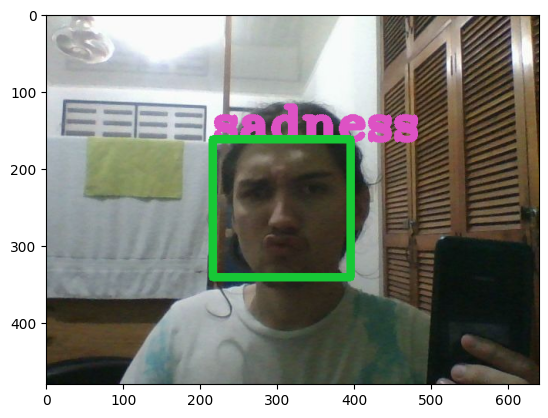

Ubicación del rostro: [[216 154 191 191]]
1/1 [==============================] - 0s 57ms/step
Predicciones:  [[2.8784261e-03 9.8211909e-05 5.4529118e-03 9.3865722e-01 1.5940320e-02
  1.5663186e-03 3.5406619e-02]]
3 [2.8784261e-03 9.8211909e-05 5.4529118e-03 9.3865722e-01 1.5940320e-02
 1.5663186e-03 3.5406619e-02]
Predicciones:  {'angry': 0.002878426, 'disgust': 9.821191e-05, 'fear': 0.005452912, 'happiness': 0.9386572, 'sadness': 0.01594032, 'surprise': 0.0015663186, 'neutral': 0.03540662}
happyness


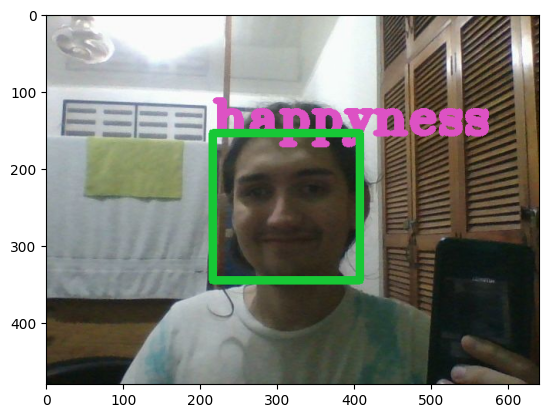

Ubicación del rostro: [[218 162 176 176]]
1/1 [==============================] - 0s 107ms/step
Predicciones:  [[0.17018384 0.00537671 0.19331373 0.00840796 0.3390084  0.01257858
  0.27113083]]
4 [0.17018384 0.00537671 0.19331373 0.00840796 0.3390084  0.01257858
 0.27113083]
Predicciones:  {'angry': 0.17018384, 'disgust': 0.0053767054, 'fear': 0.19331373, 'happiness': 0.00840796, 'sadness': 0.3390084, 'surprise': 0.012578583, 'neutral': 0.27113083}
sadness


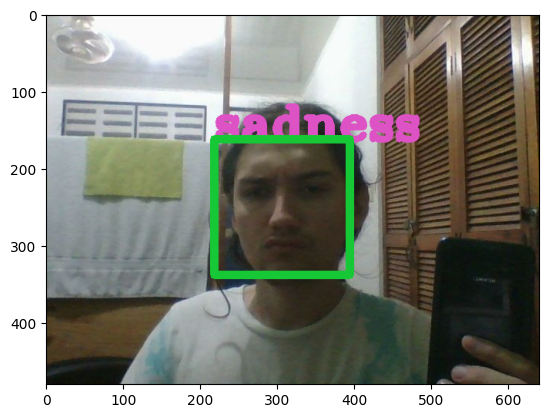

In [132]:
#Se importa la biblioteca os para eliminar archivos
import os
#Variable que contendra el URL de donde se eliminaran los datos
rutajpg = '/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/'
#Variable con la cual se llevara a cabo la eliminacion de archivos o la adjuncion de archivos
almacena = input("Digite -y- sí ya almaceno datos de imagenes, digite -n- en caso contrario: ")
from tensorflow.python.ops.math_ops import sign
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0 
#Se consulta mediante un parametro afirmativo para llamar archivos
if almacena == "y":
  #Extrae un binario almacenado en un drive y lo leé en una variable usable
  with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/valorj.bin', "rb") as f:
        #variable para cambiarle el nombre ligeramente a las imagenes
        j = pickle.load(f)
#Se consulta mediante un parametro negativo para asignar un valor inicial y eliminar archivos
elif almacena == "n":
  j = 5
  #Toma 2 o más argumentos y los reordena en una sola ruta en caso de haber diferencias en los sistemas operativos
  for archivoborrar in os.listdir(rutajpg):
        # Verifica si el archivo es una imagen
        if archivoborrar.endswith(".jpg"):
            # Crea la ruta del archivo
            ruta_archivo = os.path.join(rutajpg, archivoborrar)
            # Elimina el archivo
            os.remove(ruta_archivo)
#sublista que contendra los diccionarios por cada imagen tomada
listaface = []
#lista padre que contendra las sublistas por cada persona registrada
listaface_persona = []

while True:
  #Diccionario que se reinicia en vacio, almacenando la información por cada pasada del ciclo
  face = dict()
  js_reply = video_frame(label_html, bbox)
  if not js_reply:
    break

  # convert JS response to OpenCV Image
  img = js_to_image(js_reply["img"])
  img_copy = img

  # create transparent overlay for bounding box
  bbox_array = np.zeros([480,640,4], dtype=np.uint8)


  if count == j: #El tiempo para capturar el frame y procesarlo
    #Este sería el path de la imagen guardada
    image_path ='/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/' + 'nombre' + str(j) +  '.jpg'
    #se guarda el fotograma con el "nombre" más el número del contador i
    cv2.imwrite(image_path , img) 
    
    #Detectar los rostros usando Face Haar Cascade
    gray_image = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #En faces_deteted se encuentran los rotros detectados
    faces_detected = face_haar_cascade.detectMultiScale(gray_image,1.32,5)
    #Imprimir ubicación de los rostros en la imagen
    print("Ubicación del rostro:", faces_detected)
    im2Display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imTemp = im2Display.copy()

    #Hacer un rectángulo en cada rostro detectado en la imagen
    for (x,y,w,h) in faces_detected:
        cv2.rectangle(img,(x,y), (x+w,y+h), (255,0,0), thickness=7)

        roi_gray=gray_image[y:y+w,x:x+h]
        roi_gray=cv2.resize(roi_gray,(48,48))

        #Processes the image and adjust it to pass it to the model
        image_pixels = tf.keras.preprocessing.image.img_to_array(roi_gray)
       
        image_pixels = np.expand_dims(image_pixels, axis = 0)
        image_pixels /= 255

        #Obtener las emociones para cada rostro detectado en la imagen
        #Get the prediction of the model
        predictions = model.predict(image_pixels)
        #Mostrar todas las emociones detectadas
        print("Predicciones: ", predictions)
        #Mostrar la emoción más significativa (con el valor más alto)
        max_index = np.argmax(predictions[0])
        print(max_index, predictions[0])
        #El orden en que vienen las emociones
        emotion_detection = ('angry', 'disgust', 'fear', 'happyness', 'sadness', 'surprise', 'neutral')

        emotion_prediction = emotion_detection[max_index]
        #Crear un diccionario para almacenar la emoción y el valor para la emoción
        frame_dic = dict(
            angry = predictions[0][0],
            disgust = predictions[0][1],
            fear = predictions[0][2],            
            happiness = predictions[0][3],
            sadness = predictions[0][4],
            surprise = predictions[0][5],
            neutral = predictions[0][6]) 
        print("Predicciones: ", frame_dic)
        print( emotion_prediction )
        
        #Mostrar en la imagen un texto de la emoción más significativa
        ubicacion = (x,y)
        font = cv2.FONT_HERSHEY_TRIPLEX
        tamañoLetra = 2
        colorLetra = (221,82,196)
        grosorLetra = 7
        #Escribir texto con la emoción más significativa
        cv2.putText(imTemp, emotion_prediction, ubicacion, font, tamañoLetra, colorLetra, grosorLetra)
        pt1 = (x, y)
        pt2 = (x+w, y+h)
        color = (23,200,54)
        thickness = 10
        cv2.rectangle(imTemp, pt1, pt2, color, thickness)
    #Se añaden llaves y valores al diccionario face
    face["img"] = image_path
    face["positio"] = faces_detected
    face["emotion"] = frame_dic
    #Se añade a la sublista 
    listaface.append(face)
    #Consulta afirmativa que leé y añade informacion reescribiendola
    if almacena == "y":
      #Carga archivos binarios y los vuelve una variable funcional
      with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/infoface.bin', "rb") as f:
        listaface_persona = pickle.load(f)
        #Se le añade nueva información
        listaface_persona.append(listaface)
      #Se re-escribe en el drive
      with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/infoface.bin', "wb") as f:
        pickle.dump(listaface_persona, f)
        #Consulta negativa la cual vacia la lista padre con el fin de añadir información de cero y cargandola a drive
    else: 
      listaface_persona = []
      #añade a la lista padre los datos de la sublista
      listaface_persona.append(listaface)
      #Carga la lista padre en el drive
      with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/infoface.bin', "wb") as f:
        pickle.dump(listaface_persona, f)
    #Mostrar la imagen con los cuadros en los rostros y el texto de la emoción más significativa
    plt.imshow(imTemp)
    plt.show()

    j +=5
  count +=1
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/valorj.bin', "wb") as f:
    pickle.dump(j, f)

# Consultas


1.   Mostrar la información de todas las personas entrevistas (la información debe ser mostrada siendo saca de los diccionarios o listas, no se debe hacer simplemente la impresión en pantalla de los diccionarios o las listas). Además, de mostrar toda la información recolectada de la persona, se debe mostrar todas las imágenes que se recolectaron durante las entrevistas, las emociones reconocidas para cada imagen y las coordenadas donde se encuentra los rostros.

2.   Mostrar la información de todas las personas entrevistas ordenada ascendentemente por edad. El método de ordenamiento a utilizar es el método por inserción (la información debe ser mostrada siendo saca de los diccionarios o listas, no se debe hacer simplemente la impresión en pantalla de los diccionarios o las listas). Además, de mostrar toda la información recolectada de la persona, se debe mostrar todas las imágenes que se recolectaron durante las entrevistas, las emociones reconocidas para cada imagen y las coordenadas donde se encuentra los rostros.

3.   Mostrar la información de todas las personas entrevistas ordenada descendente mente por la cantidad de hijos. El método de ordenamiento a utilizar es el método por de la bubuja (la información debe ser mostrada siendo saca de los diccionarios o listas, no se debe hacer simplemente la impresión en pantalla de los diccionarios o las listas). Además, de mostrar toda la información recolectada de la persona, se debe mostrar todas las imágenes que se recolectaron durante las entrevistas, las emociones reconocidas para cada imagen y las coordenadas donde se encuentra los rostros.

4. Mostrar la información de todas las personas entrevistas ordenada descendentemente por la cantidad de hijos. El método de ordenamiento a utilizar es el método por de la quicksort (la información debe ser mostrada siendo saca de los diccionarios o listas, no se debe hacer simplemente la impresión en pantalla de los diccionarios o las listas). Además, de mostrar toda la información recolectada de la persona, se debe mostrar todas las imágenes que se recolectaron durante las entrevistas, las emociones reconocidas para cada imagen y las coordenadas donde se encuentra los rostros. También, imprimir una lista con sublistas donde la primera sublista tiene la información de las personas que tienen únicamente hijos de género femenino, la segunda sublista tiene información de personas que tienen únicamente hijos de género masculino y la última sublista tiene información de personas que tienen hijos tanto de género femenino como másculino. 

5. Obtener para cada persona entrevistada las emociones sin ordenar y guardar en una lista (una lista por entrevista) con sublistas la siguiente información: en la primera sublista colocar la identificación, el nombre, el género y la edad de la persona entrevistada, en las siguientes sublistas colocar las emociones expresadas por la persona. Por ejemplo, si la persona apareció en 10 fotogramas entonces se deben crear 10 sublistas, cada sublista pertenece a las emociones emitidas por el candidato en un fotograma. 

6. Una vez creada esta listas (una por entrevista) con sublistas del punto anterior, se debe ordenar las sublistas de forma ascendente por la emoción felicidad (happiness) utilizando el técnica de ordenamiento Quicksort.

7. Para cada persona entrevistada muestre un gráfico para comparar las emociones reportadas durante la entrevista.

8. Incluya en el documento escrito la entrevista a dos personas. De aportar toda la información recolectada, las imágenes recolectadas en la entrevista con un cuadro en los rostros presentes. Además, debe mostrar la información de las emociones reportadas. Por último, incluya un análisis de la importancia de este tipo de algoritmos y de la importancia de la privacidad de la información en este tipo de sistemas.




#Consulta 1

La cedula de la persona es:  67
El nombre de la persona es:  jenni
La fecha de nacimiento de la persona es el dia 9 del mes  07 del año  2001
La nacionalidad de la persona es:  tico
El número de celular es :  76
El correo electronico del usuario es 
El genero de su decendiente es :  f
La fecha de nacimiento del decendiente es:  23
El genero de su decendiente es :  f
La fecha de nacimiento del decendiente es:  23
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre40.jpg


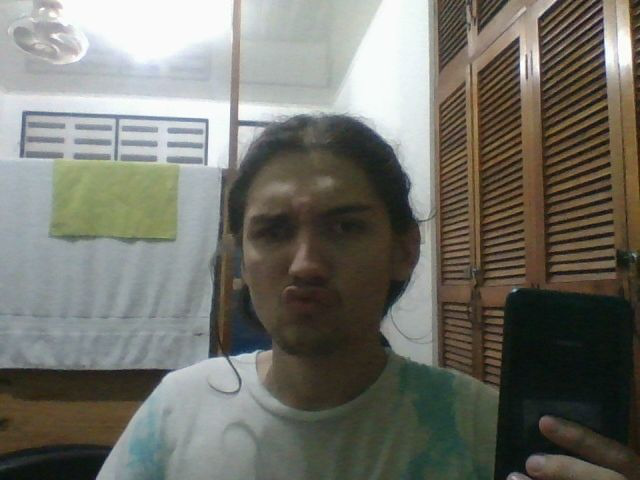

La posición de la cara en la imagen es:  [[216 162 179 179]]
La escala de emociones es:  {'angry': 0.20859514, 'disgust': 0.015216169, 'fear': 0.26947567, 'happiness': 0.006816253, 'sadness': 0.35402092, 'surprise': 0.01698726, 'neutral': 0.12888849}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre45.jpg


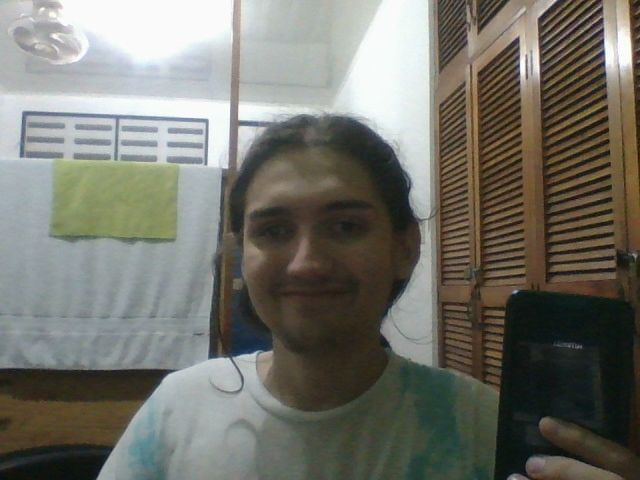

La posición de la cara en la imagen es:  [[216 154 191 191]]
La escala de emociones es:  {'angry': 0.002878426, 'disgust': 9.821191e-05, 'fear': 0.005452912, 'happiness': 0.9386572, 'sadness': 0.01594032, 'surprise': 0.0015663186, 'neutral': 0.03540662}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre50.jpg


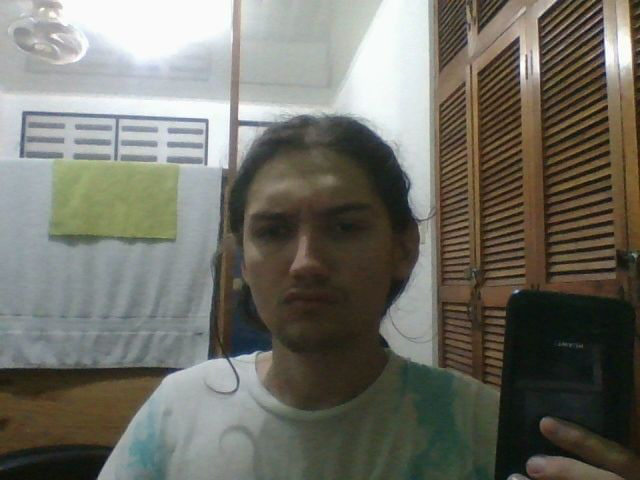

La posición de la cara en la imagen es:  [[218 162 176 176]]
La escala de emociones es:  {'angry': 0.17018384, 'disgust': 0.0053767054, 'fear': 0.19331373, 'happiness': 0.00840796, 'sadness': 0.3390084, 'surprise': 0.012578583, 'neutral': 0.27113083}



La cedula de la persona es:  2
El nombre de la persona es:  
La fecha de nacimiento de la persona es el dia 14 del mes  02 del año  2000
La nacionalidad de la persona es:  cos
El número de celular es :  63
El correo electronico del usuario es 
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre5.jpg


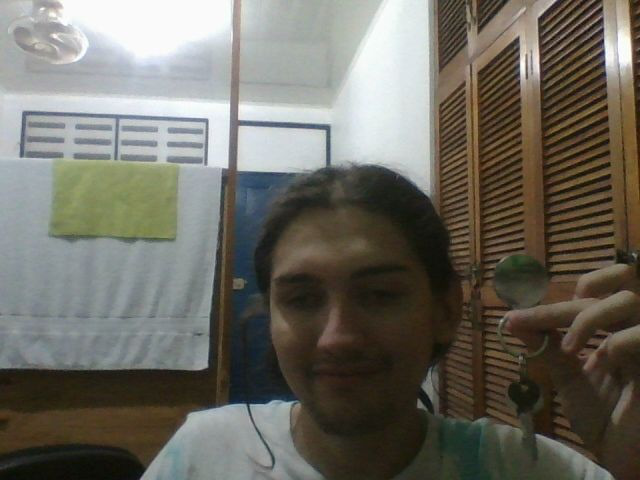

La posición de la cara en la imagen es:  [[238 213 208 208]]
La escala de emociones es:  {'angry': 0.030893931, 'disgust': 0.0018584547, 'fear': 0.067773715, 'happiness': 0.381324, 'sadness': 0.36630347, 'surprise': 0.0038823073, 'neutral': 0.14796412}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre10.jpg


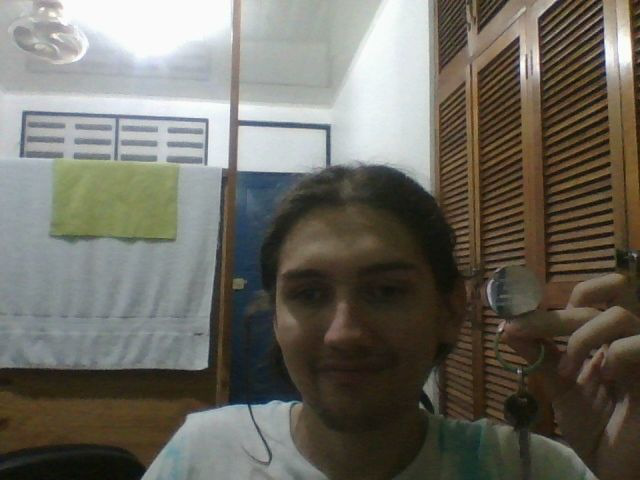

La posición de la cara en la imagen es:  [[242 211 209 209]]
La escala de emociones es:  {'angry': 0.009714008, 'disgust': 0.0005454373, 'fear': 0.018979108, 'happiness': 0.8398765, 'sadness': 0.057462826, 'surprise': 0.0040810597, 'neutral': 0.069341145}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre15.jpg


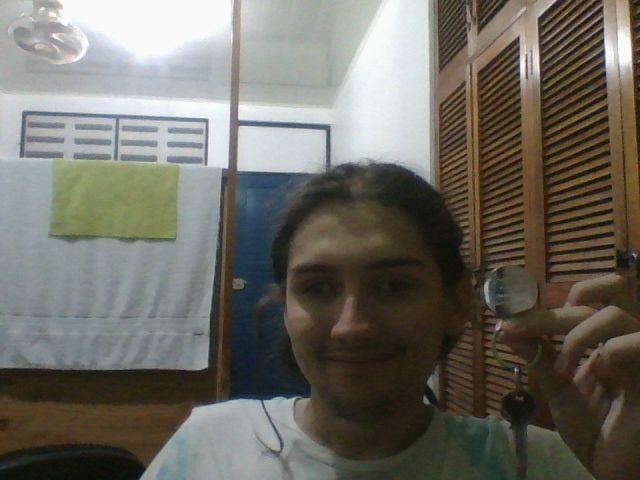

La posición de la cara en la imagen es:  [[257 212 194 194]]
La escala de emociones es:  {'angry': 0.034149252, 'disgust': 0.0025125039, 'fear': 0.08278459, 'happiness': 0.44280398, 'sadness': 0.29622668, 'surprise': 0.008292564, 'neutral': 0.1332304}



La cedula de la persona es:  78
El nombre de la persona es:  
La fecha de nacimiento de la persona es el dia 25 del mes  08 del año  2004
La nacionalidad de la persona es:  tico
El número de celular es :  8665
El correo electronico del usuario es 
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre20.jpg


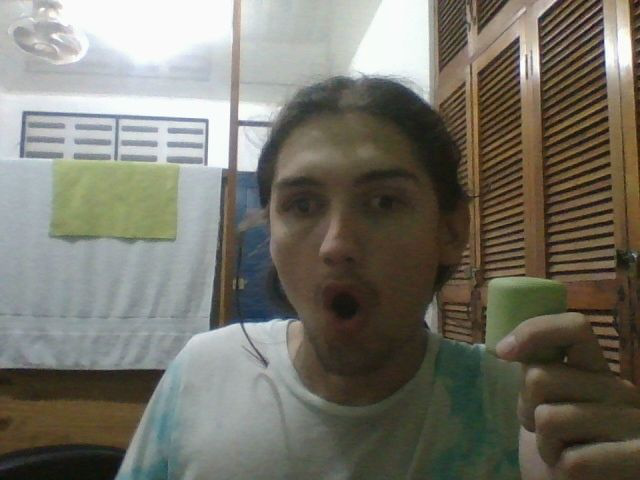

La posición de la cara en la imagen es:  [[235 118 214 214]]
La escala de emociones es:  {'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}





In [133]:
#Consulta 1
#Cargar los datos binarios para extraer la información
import pickle
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/archivobinario.bin', "rb") as f:
      lista = pickle.load(f)
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/infoface.bin', "rb") as f:
        listaface_persona = pickle.load(f)
#variables para extraer los datos de las listas
a = 1
c = 0
d = 0
e = 0
b = -1
#Ciclo con una variable menor o igual que el tamaño de la lista
while a <= len(lista):
  a = a + 1
  #Variable para recorrer la lista por persona
  mostrarlista = lista[b]
  #Variable con la que se ingresa al diccionario de la persona
  mostrar = mostrarlista[0]
  #Creación de variables para la obtención del valor de cada llave 
  id = mostrar["id"]
  print("La cedula de la persona es: ", id)
  nombre = mostrar["nombre"]
  print("El nombre de la persona es: ", nombre)
  fecha_n = mostrar["fecha_n"]
  dia = fecha_n["Dia"]
  mes = fecha_n["Mes"]
  año = fecha_n["Año"]
  print("La fecha de nacimiento de la persona es el dia", dia , "del mes ", mes, "del año ", año)
  nacionalidad = mostrar["nacionalidad"]
  print("La nacionalidad de la persona es: ", nacionalidad)
  númeroCelular = mostrar["númeroCelular"]
  print("El número de celular es : ", númeroCelular)
  correo = mostrar["correo"]
  print("El correo electronico del usuario es", correo)
  hijos = mostrar["hijos"]
  #Consulta afirmativa en caso de tener hijos con la cual agregara el genero y la fecha de nacimiento por hijo
  if hijos != []:
    #Ciclo para recorrer la lista 
    while e < len(hijos):
      #Extracción de diccionarios dentro de la lista por posición
      hijosmostrar = hijos[d]
      #Variable para extraer las variables de las llaves correspondientes
      genero = hijosmostrar["genero"]
      print("El genero de su decendiente es : ", genero)
      fecha_h = hijosmostrar["fecha_h"]
      print("La fecha de nacimiento del decendiente es: ", fecha_h)
      e = e + 1
  #Consulta negativa en caso de no tener hijos
  else: 
    print("No tiene hijos")
  #Creación de variables que contengan listas segun variables de posición
  exponerlistaface= listaface_persona[b]
  #Creación de un ciclo que recorra la sublista de la lista 
  for x in exponerlistaface:
    imagen = x["img"]
    print(imagen)
    show_compilet_images(imagen)
    posicion = x["positio"]
    print("La posición de la cara en la imagen es: ", posicion)
    emocion = x["emotion"]
    print("La escala de emociones es: ", emocion)
    print("")
    print("")
    print("")
  b = b + 1
  c = c + 1



#Funciones

In [134]:
def mayor_lista(lista):
    """ Retorna el mayor elemento de una lista. Retorna None si la lista está vacía
    Arguments: lista {list} -- Lista de valores númericos
    Returns: int -- Mayor de los elementos de la lista
    """
    if len(lista)==0:
        return (None)
    else:
        mayor_temporal = lista[0]
        for x in lista[1:]:
            if x > mayor_temporal:
                mayor_temporal = x
        return mayor_temporal

In [135]:
def ordenamiento_insercion(lista):
    """
    Ordenamiento basado en insercciones
    Arguments: lista {list} -- Lista Desordenada
    Returns: nueva_lista {list} Lista Ordenada 
    """
    nueva_lista = []
    while len(lista) > 0:
        mayor = mayor_lista (lista)
        nueva_lista.insert(0, mayor)
        lista.remove(mayor)
    return nueva_lista

In [136]:
import pickle

with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/cantidad.bin', "rb") as f:
    lista_cantidad = pickle.load(f)
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/archivobinario.bin', "rb") as f:
    lista = pickle.load(f)

with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/infoface.bin', "rb") as f:
    listaface_persona = pickle.load(f)
lista_cantidad2= lista_cantidad    
def ordenamiento_burbuja(lista):
    """Utiliza el método de burbuja para ordenar una lista (La lista es recibida por referencia)
    Argumentos:
        lista {list} -- Lista a Ordenar (Por referencia)
    Returna:
        lista {list} -- Lista Ordenada
    """
    pasadas=len(lista)-1
    while pasadas>0:
        #print ("Pasada: ",pasadas)
        pos=0
        while pos<pasadas:
            if lista[pos]<lista[pos+1]:
                temp=lista[pos]
                lista[pos]=lista[pos+1]
                lista[pos+1]=temp
            pos=pos+1
        pasadas=pasadas-1
    return lista


In [137]:
from PIL import Image
#Muestra la imagen (Parametro = url de la imagen)
def show_compilet_images(url):
  image = Image.open(url)
  image.show()

In [138]:
def quicksort_ascendente(lista):
    if len(lista) <= 1:
        return lista
    else:
        pivote = lista[0]
        menores = [x for x in lista[1:] if x < pivote]
        mayores = [x for x in lista[1:] if x >= pivote]
        return quicksort_ascendente(menores) + [pivote] + quicksort_ascendente(mayores)
print(quicksort_ascendente(lista_cantidad))


[1, 2, 3]


In [139]:
def quicksort_descendente(lista):
    if len(lista) <= 1:
        return lista
    else:
        pivote = lista[0]
        menores = [x for x in lista[1:] if x >= pivote]
        mayores = [x for x in lista[1:] if x < pivote]
        return quicksort_descendente(menores) + [pivote] + quicksort_descendente(mayores)

#Consulta 2



Ingrese -y- sí ya guardo las edades de lás personas, en caso contrario -n-: n
digite el año actual: 2023
3
La cedula de la persona es:  78
El nombre de la persona es:  
La fecha de nacimiento de la persona es el dia 25 del mes  08 del año  2004
La nacionalidad de la persona es:  tico
El número de celular es :  8665
El correo electronico del usuario es 
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  89
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre20.jpg


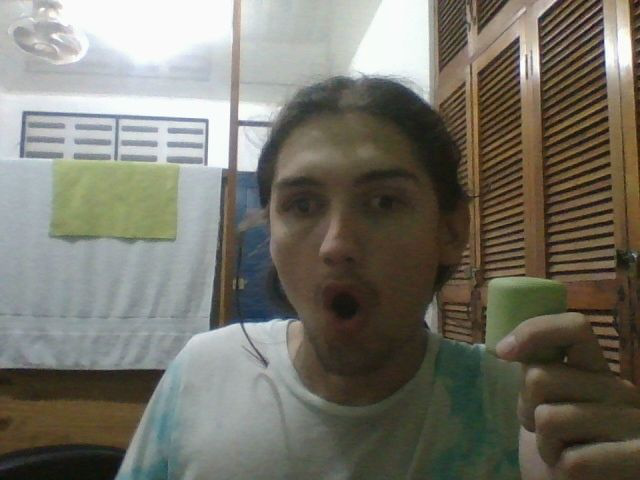

La posición de la cara en la imagen es:  [[235 118 214 214]]
La escala de emociones es:  {'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}



La cedula de la persona es:  67
El nombre de la persona es:  jenni
La fecha de nacimiento de la persona es el dia 9 del mes  07 del año  2001
La nacionalidad de la persona es:  tico
El número de celular es :  76
El correo electronico del usuario es 
El genero de su decendiente es :  f
La fecha de nacimiento del decendiente es:  23
El genero de su decendiente es :  f
La fecha de nacimiento del decendiente es:  23
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre20.jpg


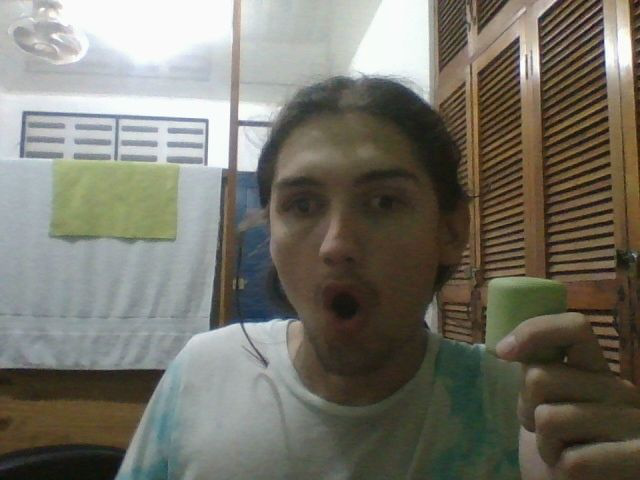

La posición de la cara en la imagen es:  [[235 118 214 214]]
La escala de emociones es:  {'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre25.jpg


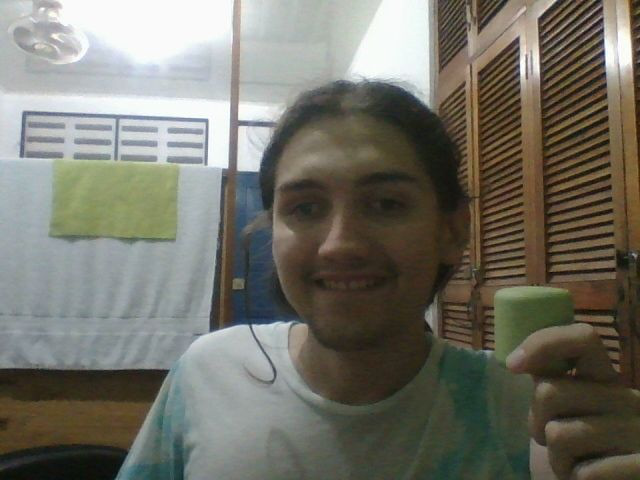

La posición de la cara en la imagen es:  [[240 126 202 202]]
La escala de emociones es:  {'angry': 0.0012369733, 'disgust': 3.142413e-05, 'fear': 0.0034739948, 'happiness': 0.95662737, 'sadness': 0.009192061, 'surprise': 0.0013701661, 'neutral': 0.028067874}



La cedula de la persona es:  2
El nombre de la persona es:  
La fecha de nacimiento de la persona es el dia 14 del mes  02 del año  2000
La nacionalidad de la persona es:  cos
El número de celular es :  63
El correo electronico del usuario es 
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre5.jpg


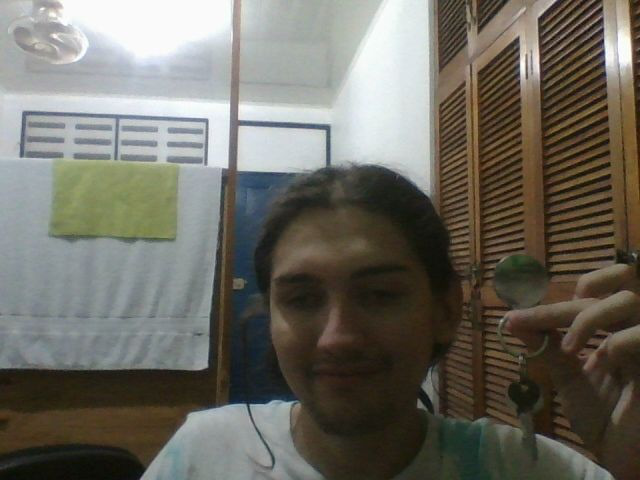

La posición de la cara en la imagen es:  [[238 213 208 208]]
La escala de emociones es:  {'angry': 0.030893931, 'disgust': 0.0018584547, 'fear': 0.067773715, 'happiness': 0.381324, 'sadness': 0.36630347, 'surprise': 0.0038823073, 'neutral': 0.14796412}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre10.jpg


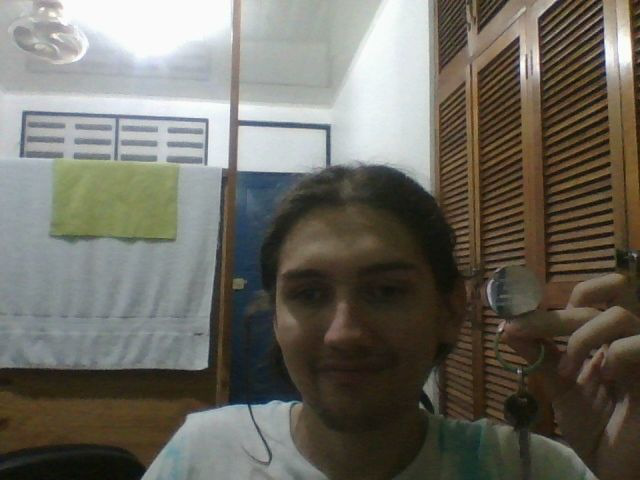

La posición de la cara en la imagen es:  [[242 211 209 209]]
La escala de emociones es:  {'angry': 0.009714008, 'disgust': 0.0005454373, 'fear': 0.018979108, 'happiness': 0.8398765, 'sadness': 0.057462826, 'surprise': 0.0040810597, 'neutral': 0.069341145}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre15.jpg


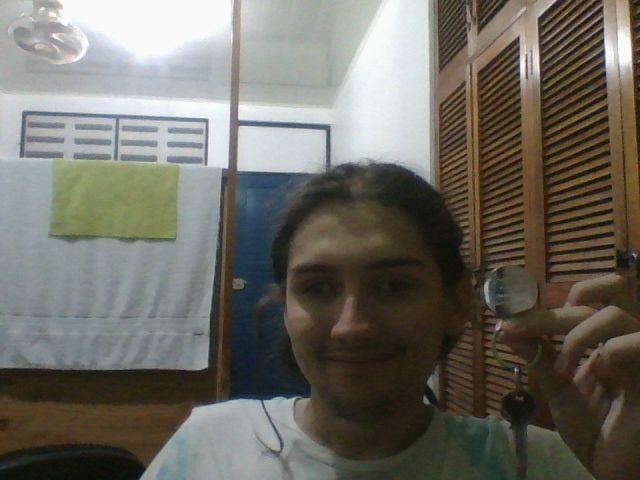

La posición de la cara en la imagen es:  [[257 212 194 194]]
La escala de emociones es:  {'angry': 0.034149252, 'disgust': 0.0025125039, 'fear': 0.08278459, 'happiness': 0.44280398, 'sadness': 0.29622668, 'surprise': 0.008292564, 'neutral': 0.1332304}





In [140]:
#Consulta 2
#Cargar los datos binarios para extraer la información
import pickle
consulta = input("Ingrese -y- sí ya guardo las edades de lás personas, en caso contrario -n-: ")
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/archivobinario.bin', "rb") as f:
      lista = pickle.load(f)
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/infoface.bin', "rb") as f:
        listaface_persona = pickle.load(f)
#Ciclo con una variable menor o igual que el tamaño de la lista
q = 1
g = 0
listaedades = []
añoactual = int(input('digite el año actual: '))
print(len(lista))
while q <= len(lista):
  q = q + 1
  #Variable para recorrer la lista por persona
  mostrarlista = lista[g]
  #Variable con la que se ingresa al diccionario de la persona
  mostrar = mostrarlista[0]
  #Creación de variables para la obtención del valor de cada llave 
  fecha_n = mostrar["fecha_n"]
  año = fecha_n["Año"]
  if consulta == "y":
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/listaedades.bin', "rb") as f:
        listaedades = pickle.load(f)
  elif consulta == "n":
    edad_persona = int(añoactual - año)
    listaedades.append(edad_persona)
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/listaedades.bin', "wb") as f:
        pickle.dump(listaedades, f)
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/listaedades.bin', "rb") as f:
        listaedades = pickle.load(f)
    
  g = g + 1
lista_ordenada = ordenamiento_insercion(listaedades)

for x in lista_ordenada:
  h = 1
  i = 0
  a = 1
  d = 0
  e = 0
  v = 0
  while a <= len(lista):
    mostrar = lista[i]
    mostrarface = mostrar[0]
    face = mostrarface["fecha_n"]
    edad_evaluar = face["Año"]
    edad_personaevaluar = int(añoactual - edad_evaluar) 
    a = a + 1
    i = i + 1
    if x == edad_personaevaluar:
          #Creación de variables para la obtención del valor de cada llave
          id = mostrarface["id"]
          print("La cedula de la persona es: ", id)
          nombre = mostrarface["nombre"]
          print("El nombre de la persona es: ", nombre)
          fecha_n = mostrarface["fecha_n"]
          dia = fecha_n["Dia"]
          mes = fecha_n["Mes"]
          año = fecha_n["Año"]
          print("La fecha de nacimiento de la persona es el dia", dia , "del mes ", mes, "del año ", año)
          nacionalidad = mostrarface["nacionalidad"]
          print("La nacionalidad de la persona es: ", nacionalidad)
          númeroCelular = mostrarface["númeroCelular"]
          print("El número de celular es : ", númeroCelular)
          correo = mostrarface["correo"]
          print("El correo electronico del usuario es", correo)
          hijos = mostrarface["hijos"]
          #Consulta afirmativa en caso de tener hijos con la cual agregara el genero y la fecha de nacimiento por hijo
          if hijos != []:
            #Ciclo para recorrer la lista 
            while e < len(hijos):
              #Extracción de diccionarios dentro de la lista por posición
              hijosmostrar = hijos[d]
              #Variable para extraer las variables de las llaves correspondientes
              genero = hijosmostrar["genero"]
              print("El genero de su decendiente es : ", genero)
              fecha_h = hijosmostrar["fecha_h"]
              print("La fecha de nacimiento del decendiente es: ", fecha_h)
              e = e + 1
              d = d + 1
          else: 
            print("No tiene hijos")
          #Creación de variables que contengan listas segun variables de posición
          exponerlistaface = listaface_persona[v]
          #Creación de un ciclo que recorra la sublista de la lista 
          for y in exponerlistaface:
            imagen = y["img"]
            print(imagen)
            show_compilet_images(imagen)
            posicion = y["positio"]
            print("La posición de la cara en la imagen es: ", posicion)
            emocion = y["emotion"]
            print("La escala de emociones es: ", emocion)
            print("")
            print("")
            print("")
    v = v + 1

#Consulta 3

[3, 2, 1]
valor de a:  1 <= largo de lista:  3
[{'id': 2, 'nombre': '', 'fecha_n': {'Dia': 14, 'Mes': '02', 'Año': 2000}, 'nacionalidad': 'cos', 'númeroCelular': 63, 'correo': '', 'estado_civil': '', 'hijos': [{'genero': 'm', 'fecha_h': '6'}, {'genero': 'm', 'fecha_h': '6'}, {'genero': 'm', 'fecha_h': '6'}]}]
Este es comp en ciclo 3
Esta es x en ciclo 3
La cedula de la persona es:  2
El nombre de la persona es:  
La fecha de nacimiento de la persona es el dia 14 del mes  02 del año  2000
La nacionalidad de la persona es:  cos
El número de celular es :  63
El correo electronico del usuario es 
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre5.jpg


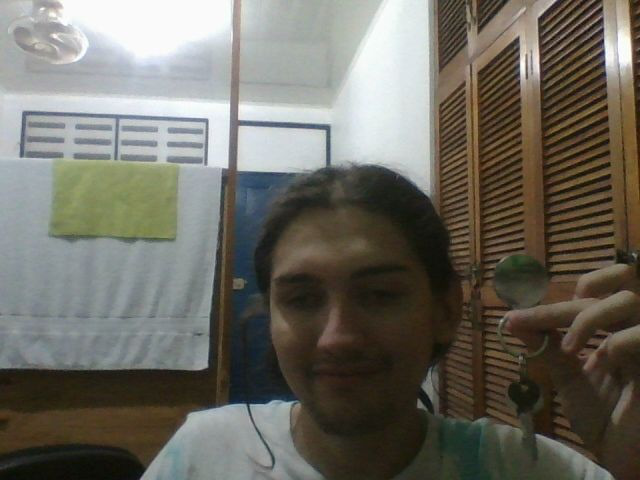

La posición de la cara en la imagen es:  [[238 213 208 208]]
La escala de emociones es:  {'angry': 0.030893931, 'disgust': 0.0018584547, 'fear': 0.067773715, 'happiness': 0.381324, 'sadness': 0.36630347, 'surprise': 0.0038823073, 'neutral': 0.14796412}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre10.jpg


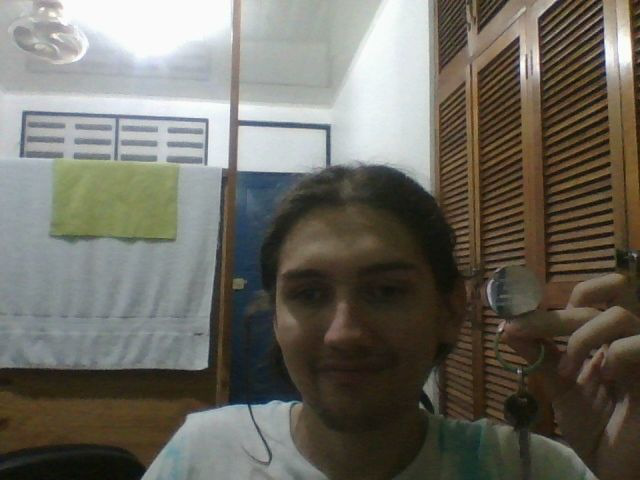

La posición de la cara en la imagen es:  [[242 211 209 209]]
La escala de emociones es:  {'angry': 0.009714008, 'disgust': 0.0005454373, 'fear': 0.018979108, 'happiness': 0.8398765, 'sadness': 0.057462826, 'surprise': 0.0040810597, 'neutral': 0.069341145}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre15.jpg


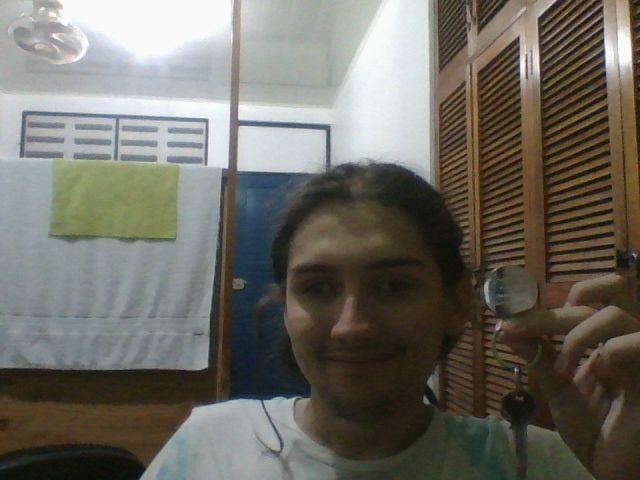

La posición de la cara en la imagen es:  [[257 212 194 194]]
La escala de emociones es:  {'angry': 0.034149252, 'disgust': 0.0025125039, 'fear': 0.08278459, 'happiness': 0.44280398, 'sadness': 0.29622668, 'surprise': 0.008292564, 'neutral': 0.1332304}



Esta es x en ciclo 2
Esta es x en ciclo 1
valor de a:  2 <= largo de lista:  3
[{'id': 78, 'nombre': '', 'fecha_n': {'Dia': 25, 'Mes': '08', 'Año': 2004}, 'nacionalidad': 'tico', 'númeroCelular': 8665, 'correo': '', 'estado_civil': 'vio', 'hijos': [{'genero': 'm', 'fecha_h': '89'}]}]
Este es comp en ciclo 2
Esta es x en ciclo 3
Esta es x en ciclo 2
La cedula de la persona es:  78
El nombre de la persona es:  
La fecha de nacimiento de la persona es el dia 25 del mes  08 del año  2004
La nacionalidad de la persona es:  tico
El número de celular es :  8665
El correo electronico del usuario es 
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre20.jpg


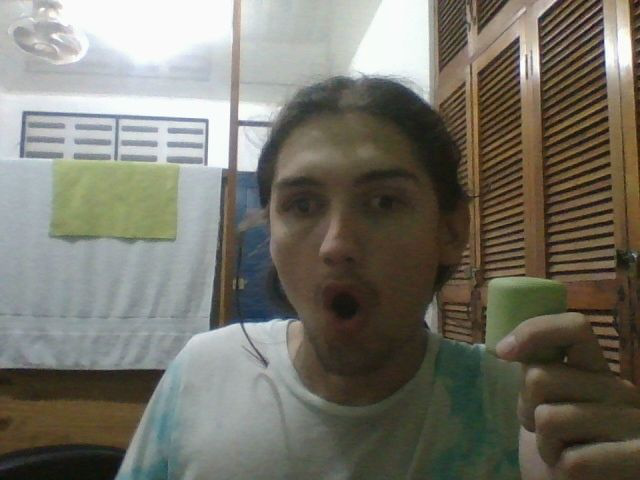

La posición de la cara en la imagen es:  [[235 118 214 214]]
La escala de emociones es:  {'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}



Esta es x en ciclo 1
valor de a:  3 <= largo de lista:  3
[{'id': 67, 'nombre': 'jenni', 'fecha_n': {'Dia': 9, 'Mes': '07', 'Año': 2001}, 'nacionalidad': 'tico', 'númeroCelular': 76, 'correo': '', 'estado_civil': 'casada', 'hijos': [{'genero': 'f', 'fecha_h': '23'}, {'genero': 'f', 'fecha_h': '23'}]}]
Este es comp en ciclo 1
Esta es x en ciclo 3
Esta es x en ciclo 2
Esta es x en ciclo 1
La cedula de la persona es:  67
El nombre de la persona es:  jenni
La fecha de nacimiento de la persona es el dia 9 del mes  07 del año  2001
La nacionalidad de la persona es:  tico
El número de celular es :  76
El correo electronico del usuario es 
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre20.jpg


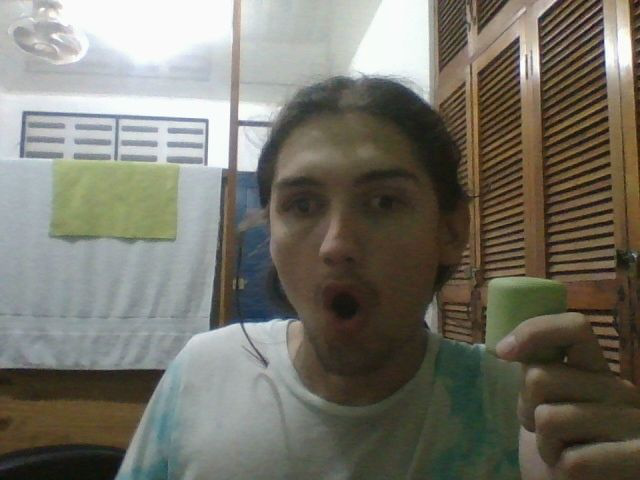

La posición de la cara en la imagen es:  [[235 118 214 214]]
La escala de emociones es:  {'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre25.jpg


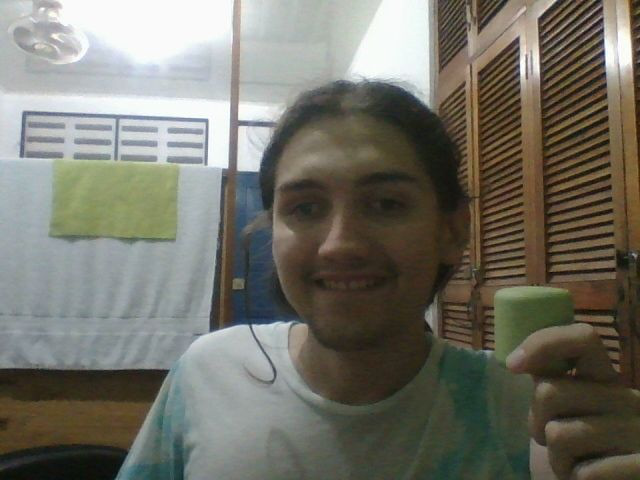

La posición de la cara en la imagen es:  [[240 126 202 202]]
La escala de emociones es:  {'angry': 0.0012369733, 'disgust': 3.142413e-05, 'fear': 0.0034739948, 'happiness': 0.95662737, 'sadness': 0.009192061, 'surprise': 0.0013701661, 'neutral': 0.028067874}





In [141]:


#Consulta 3

ordenado_burbuja =  ordenamiento_burbuja(lista_cantidad)

print(ordenado_burbuja)
i= 0
a= 1
v= 0
e= 0
d= 0
while a <= len(lista):
  print("valor de a: ", a, "<= largo de lista: ",len(lista))
  mostrar = lista[i]
  mostrarface = mostrar[0]
  print(mostrar)
  comp= ordenado_burbuja[i]
  print("Este es comp en ciclo", comp)
  a = a + 1
  i = i + 1 
  for x in lista_cantidad:
    print("Esta es x en ciclo", x)
    if x == comp:  
       #Creación de variables para la obtención del valor de cada llave
          id = mostrarface["id"]
          print("La cedula de la persona es: ", id)
          nombre = mostrarface["nombre"]
          print("El nombre de la persona es: ", nombre)
          fecha_n = mostrarface["fecha_n"]
          dia = fecha_n["Dia"]
          mes = fecha_n["Mes"]
          año = fecha_n["Año"]
          print("La fecha de nacimiento de la persona es el dia", dia , "del mes ", mes, "del año ", año)
          nacionalidad = mostrarface["nacionalidad"]
          print("La nacionalidad de la persona es: ", nacionalidad)
          númeroCelular = mostrarface["númeroCelular"]
          print("El número de celular es : ", númeroCelular)
          correo = mostrarface["correo"]
          print("El correo electronico del usuario es", correo)
          hijos = mostrarface["hijos"]
          #Consulta afirmativa en caso de tener hijos con la cual agregara el genero y la fecha de nacimiento por hijo
          if hijos != []:
            #Ciclo para recorrer la lista 
            while e < len(hijos):
              #Extracción de diccionarios dentro de la lista por posición
              hijosmostrar = hijos[d]
              #Variable para extraer las variables de las llaves correspondientes
              genero = hijosmostrar["genero"]
              print("El genero de su decendiente es : ", genero)
              fecha_h = hijosmostrar["fecha_h"]
              print("La fecha de nacimiento del decendiente es: ", fecha_h)
              e = e + 1
              d = d + 1
          else: 
            print("No tiene hijos")
          #Creación de variables que contengan listas segun variables de posición
          exponerlistaface = listaface_persona[v]
          #Creación de un ciclo que recorra la sublista de la lista 
          for y in exponerlistaface:
            imagen = y["img"]
            print(imagen)
            show_compilet_images(imagen)
            posicion = y["positio"]
            print("La posición de la cara en la imagen es: ", posicion)
            emocion = y["emotion"]
            print("La escala de emociones es: ", emocion)
            print("")
            print("")
            print("")
        
  v = v + 1

#Consulta 4

[3, 2, 1]
Esta es mi x en este momento 3
[{'id': 2, 'nombre': '', 'fecha_n': {'Dia': 14, 'Mes': '02', 'Año': 2000}, 'nacionalidad': 'cos', 'númeroCelular': 63, 'correo': '', 'estado_civil': '', 'hijos': [{'genero': 'm', 'fecha_h': '6'}, {'genero': 'm', 'fecha_h': '6'}, {'genero': 'm', 'fecha_h': '6'}]}]
La cedula de la persona es:  2
El nombre de la persona es:  
La fecha de nacimiento de la persona es el dia 14 del mes  02 del año  2000
La nacionalidad de la persona es:  cos
El número de celular es :  63
El correo electronico del usuario es 
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
El genero de su decendiente es :  m
La fecha de nacimiento del decendiente es:  6
/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre5.jpg


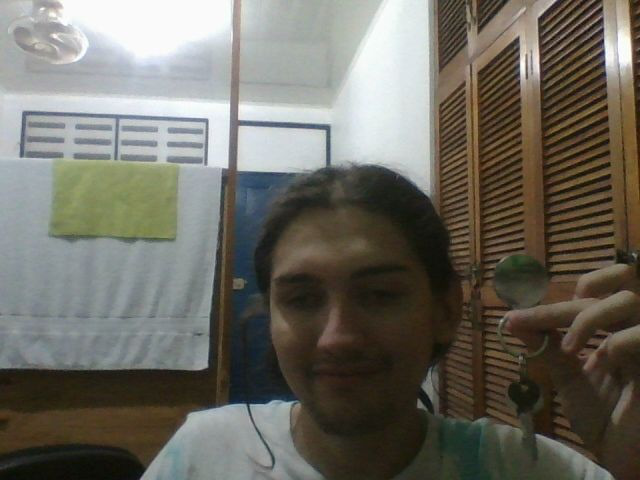

La posición de la cara en la imagen es:  [[238 213 208 208]]
La escala de emociones es:  {'angry': 0.030893931, 'disgust': 0.0018584547, 'fear': 0.067773715, 'happiness': 0.381324, 'sadness': 0.36630347, 'surprise': 0.0038823073, 'neutral': 0.14796412}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre10.jpg


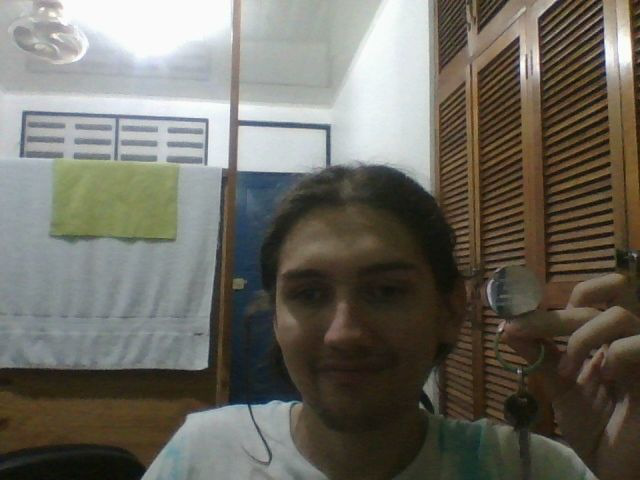

La posición de la cara en la imagen es:  [[242 211 209 209]]
La escala de emociones es:  {'angry': 0.009714008, 'disgust': 0.0005454373, 'fear': 0.018979108, 'happiness': 0.8398765, 'sadness': 0.057462826, 'surprise': 0.0040810597, 'neutral': 0.069341145}



/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/nombre15.jpg


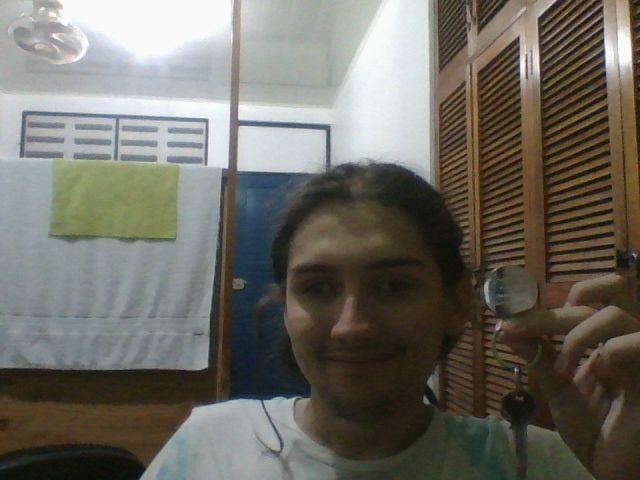

La posición de la cara en la imagen es:  [[257 212 194 194]]
La escala de emociones es:  {'angry': 0.034149252, 'disgust': 0.0025125039, 'fear': 0.08278459, 'happiness': 0.44280398, 'sadness': 0.29622668, 'surprise': 0.008292564, 'neutral': 0.1332304}



[{'id': 78, 'nombre': '', 'fecha_n': {'Dia': 25, 'Mes': '08', 'Año': 2004}, 'nacionalidad': 'tico', 'númeroCelular': 8665, 'correo': '', 'estado_civil': 'vio', 'hijos': [{'genero': 'm', 'fecha_h': '89'}]}]
[{'id': 78, 'nombre': '', 'fecha_n': {'Dia': 25, 'Mes': '08', 'Año': 2004}, 'nacionalidad': 'tico', 'númeroCelular': 8665, 'correo': '', 'estado_civil': 'vio', 'hijos': [{'genero': 'm', 'fecha_h': '89'}]}]
Esta es mi x en este momento 2
Esta es mi x en este momento 1


In [142]:
with open("/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/cantidad.bin", "rb") as f:
    lista_cantidad = pickle.load(f)
    listac = lista_cantidad
ordenadoquicksort = quicksort_descendente(lista_cantidad)
print(ordenadoquicksort)

i= 0 
j= 0    
v = 0
k = 0    
l = 0 
for x in ordenadoquicksort:
    print("Esta es mi x en este momento",x) 
    c = 0 
    while j < len(lista):
        mostrar = lista[i]
        mostrarface = mostrar[0]
        print(mostrar)
        comp = listac[c]
        if x == comp:  
              #Creación de variables para la obtención del valor de cada llave
              id = mostrarface["id"]
              print("La cedula de la persona es: ", id)
              nombre = mostrarface["nombre"]
              print("El nombre de la persona es: ", nombre)
              fecha_n = mostrarface["fecha_n"]
              dia = fecha_n["Dia"]
              mes = fecha_n["Mes"]
              año = fecha_n["Año"]
              print("La fecha de nacimiento de la persona es el dia", dia , "del mes ", mes, "del año ", año)
              nacionalidad = mostrarface["nacionalidad"]
              print("La nacionalidad de la persona es: ", nacionalidad)
              númeroCelular = mostrarface["númeroCelular"]
              print("El número de celular es : ", númeroCelular)
              correo = mostrarface["correo"]
              print("El correo electronico del usuario es", correo)
              hijos = mostrarface["hijos"]
              #Consulta afirmativa en caso de tener hijos con la cual agregara el genero y la fecha de nacimiento por hijo
              if hijos != []:
                #Ciclo para recorrer la lista 
                while k < len(hijos):
                  #Extracción de diccionarios dentro de la lista por posición
                  hijosmostrar = hijos[l]
                  #Variable para extraer las variables de las llaves correspondientes
                  genero = hijosmostrar["genero"]
                  print("El genero de su decendiente es : ", genero)
                  fecha_h = hijosmostrar["fecha_h"]
                  print("La fecha de nacimiento del decendiente es: ", fecha_h)
                  k = k + 1
                  l = l + 1
              else: 
                print("No tiene hijos")
              #Creación de variables que contengan listas segun variables de posición
              exponerlistaface = listaface_persona[v]
              #Creación de un ciclo que recorra la sublista de la lista 
              for y in exponerlistaface:
                imagen = y["img"]
                print(imagen)
                show_compilet_images(imagen)
                posicion = y["positio"]
                print("La posición de la cara en la imagen es: ", posicion)
                emocion = y["emotion"]
                print("La escala de emociones es: ", emocion)
                print("")
                print("")
                print("")
              i = i + 1
              j = j + 1
              v = v + 1
              c = c + 1
        else:
            c = c + 1
            j = j + 1
            v = v + 1

#Consulta 5

In [150]:
#Consulta 5 
#Cargar los datos binarios para extraer la información
consulta = input("Ingrese -y- sí ya guardo las informacion de este bloque de lás personas, en caso contrario -n-: ")
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/genero.bin', "rb") as f:
   listaconsulta = pickle.load(f)
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/archivobinario.bin', "rb") as f:
   lista = pickle.load(f)
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar imagenes/infoface.bin', "rb") as f:
   listaface_persona = pickle.load(f)
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/listaedades.bin', "rb") as f:
   listaedades = pickle.load(f)
   
i = 0
a = 1
v = 0
lista_personas = []
if consulta == "n":
    while a <= len(lista):
      a = a + 1
      lista_persona = []
      lista_info =[]
      mostrar = lista[i]
      mostrarp = mostrar[0]
      id = mostrarp["id"]
      nombre = mostrarp["nombre"]
      genero = listaconsulta[i]
      lista_edad= listaedades[i]
      i = i + 1
      lista_info = [id, nombre, genero, lista_edad]
      lista_persona.append(lista_info)
      #Creación de variables que contengan listas segun variables de posición
      exponerlistaface = listaface_persona[v]
      v = v + 1
      #Creación de un ciclo que recorra la sublista de la lista 
      for y in exponerlistaface:
        lista_emocion = []
        emocion = y["emotion"]
        lista_emocion.append(emocion)
        lista_persona.append(lista_emocion)
      lista_personas.append(lista_persona)
    with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/listaconsultas.bin', "wb") as f:
        pickle.dump(lista_personas, f)
        print(lista_personas)
elif consulta == "y":
  with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/listaconsultas.bin', "rb") as f:
      lista_personas = pickle.load(f)
      print(lista_personas)



Ingrese -y- sí ya guardo las informacion de este bloque de lás personas, en caso contrario -n-: n
[[[2, '', 'ma', 23], [{'angry': 0.030893931, 'disgust': 0.0018584547, 'fear': 0.067773715, 'happiness': 0.381324, 'sadness': 0.36630347, 'surprise': 0.0038823073, 'neutral': 0.14796412}], [{'angry': 0.009714008, 'disgust': 0.0005454373, 'fear': 0.018979108, 'happiness': 0.8398765, 'sadness': 0.057462826, 'surprise': 0.0040810597, 'neutral': 0.069341145}], [{'angry': 0.034149252, 'disgust': 0.0025125039, 'fear': 0.08278459, 'happiness': 0.44280398, 'sadness': 0.29622668, 'surprise': 0.008292564, 'neutral': 0.1332304}]], [[78, '', 'ma', 19], [{'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}]], [[67, 'jenni', 'mascu', 22], [{'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}], [{

#Consulta 6

In [215]:
#Consulta 6
import pickle
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/archivobinario.bin', "rb") as f:
    lista = pickle.load(f)
with open('/content/drive/MyDrive/Proyecto taller primera parte/Guardar_diccionario/listaconsultas.bin', "rb") as f:
      lista_personas = pickle.load(f)
a = 0
i = 0
lista_reestructurada = []
listausar = []
while a < len(lista_personas):
  lista_emociones = []
  usar = []
  contenido = lista_personas[i]
  b = 1
  c = 1
  while b < len(contenido):
    mostrar = contenido[c]
    mostraremo = mostrar[0]
    happiness = mostraremo["happiness"]
    lista_emociones.append(happiness)
    b = b + 1
    c = c + 1
    usar.append(happiness)
  
  usarcomparar = [usar]
  listausar.append(usarcomparar)
  ordenamientoquicksort = quicksort_ascendente(lista_emociones)
  lista_nueva = [ordenamientoquicksort]
  lista_reestructurada.append(lista_nueva)
  a = a + 1
  i = i + 1
print("lista_personas", lista_personas)
print("ordenado", lista_reestructurada)

renovarlista = []
for reestructure in lista_reestructurada:
  im = 0
  mu = 0
  for w in reestructure:
    print()
    print("este es mi w", w)
    print()
    original_xd = 1
    imcopy = im
    mucopy = mu
    while imcopy < len(w):

      espacio = w[mucopy]
      print()
      print("Este es mi valor ordenado en este momento", espacio) 
      ind = 0
      pi = 0
      c = 0
      xd = original_xd 
      #for pe in lista_personas:
        #Preguntarle a Jhordan o a Victor como puedo hacer que se lean las listas en el mismo orden para que no se lea todo por cada punto
      while ind < len(lista_personas):
        muestre = lista_personas[pi]
        #print("Este es muestre en la posicion 0", muestre[0])
        muecero = muestre[0]
        
        renovarlista.append(muecero)
        #print("Este es mi muestre",muestre)
        ind = ind + 1
        pi = pi + 1
        sublista_agregar = []
        for imu in muestre:
          if len(imu)==1:
            entre = imu[0]
            hapy = entre["happiness"]
            if hapy == espacio:
              #print("este es imu", hapy)
              
              sublista_agregar.append(entre)
              renovarlista.append(sublista_agregar)
          
        
         
      imcopy = imcopy + 1
      mucopy = mucopy + 1
    print("lista renovada", renovarlista)  
    imcopy = im
    mucopy = mu
    print()
    print()
      

          
        


       

lista_personas [[[2, '', 'ma', 23], [{'angry': 0.030893931, 'disgust': 0.0018584547, 'fear': 0.067773715, 'happiness': 0.381324, 'sadness': 0.36630347, 'surprise': 0.0038823073, 'neutral': 0.14796412}], [{'angry': 0.009714008, 'disgust': 0.0005454373, 'fear': 0.018979108, 'happiness': 0.8398765, 'sadness': 0.057462826, 'surprise': 0.0040810597, 'neutral': 0.069341145}], [{'angry': 0.034149252, 'disgust': 0.0025125039, 'fear': 0.08278459, 'happiness': 0.44280398, 'sadness': 0.29622668, 'surprise': 0.008292564, 'neutral': 0.1332304}]], [[78, '', 'ma', 19], [{'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}]], [[67, 'jenni', 'mascu', 22], [{'angry': 0.023873067, 'disgust': 0.00213917, 'fear': 0.25732306, 'happiness': 0.01010923, 'sadness': 0.07281997, 'surprise': 0.518717, 'neutral': 0.11501846}], [{'angry': 0.0012369733, 'disgust': 3.142413e-05, 'fear': 0.0034739948, 'happiness': 

#Consulta 7

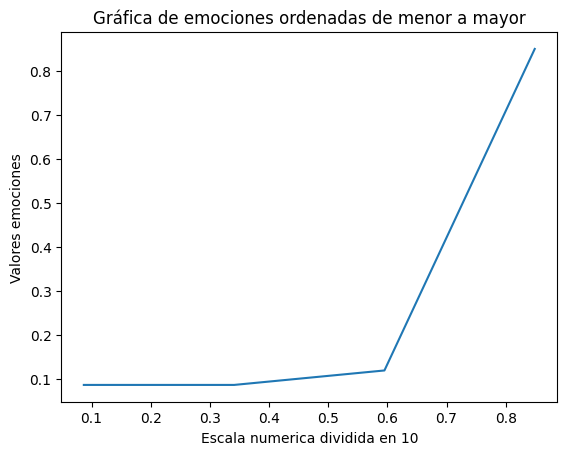

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

ordenamientoquicksort = ordenamiento_quickSort_ascendente(lista_emociones)

min_valor = min(ordenamientoquicksort)
max_valor = max(ordenamientoquicksort)
num_elementos = len(ordenamientoquicksort)

indices = np.linspace(min_valor, max_valor, num_elementos)

plt.plot(indices, ordenamientoquicksort)
plt.xlabel('Escala numerica dividida en 10')
plt.ylabel('Valores emociones')
plt.title('Gráfica de emociones ordenadas de menor a mayor')

plt.show()

## Aspectos administrativos


* La tarea será desarrollada en equipos de trabajo de máximo 2 personas.
* Cualquier acción de plagio será sancionada con una nota de 0 y la carta al expediente respectiva para todos los
implicados.
* La fecha de entrega será la semana 11, el día de clases, antes de la hora de clases.
* Para llevar el control de versiones del proyecto se debe crear un repositorio en GitLab y agregar al profesor (agregarlo
a la cuenta amendez.tec@gmail.com).
* Para llevar el control del las tareas a realizar por participante en el proyecto debe utilizar la herramienta
https://trello.com/es y compartir el link en el mismo Google Doc en que se comparte el link de la plantilla de Overleaf. Pueden crear tab de todas las tareas o requerimientos, un tab para las tareas en proceso y un tab para las tareas hechas.
* La codificación y documentación interna deberá ser desarrollada en idioma inglés utilizando el estándar docString de Python.
*La documentación externa debe estar redactada en idioma inglés utilizando la herramienta Overleaf (utilizar la plantilla facilitada por el profesor). La documentación es evaluada en el curso de Introducción a la programación.
* Documentación del Código utilizando Docstring Conventions 	
* Introducción a Python la Guía de Estilo de Código en Python
* La entrega será mediante la plataforma TecDigital en el espacio de Proyecto – Etapa 1. Lo que debe subir es un archivo de tipo notebook cuya extensión es (.ipynb). Además, en este archivo deben venir los enlaces a las imagenes utilizados para la tarea.
* Se recomienda que se empiece a trabajar lo antes posible.



# "La programación es una habilidad que puedes cultivar en ti mismo y usar para cambiar el mundo". - Barack Obama